# A Global Exploration of Income and Life Expectancy
by: Cale Nearing


## Introduction
In this kernel, I will be looking at relationships between average national income and national life expectancy, over time, using data collected from 197 countries around the world.  I will be focusing on the period since 1945, the end of the second world war, both because I think this "modern world" era is more interesting in terms of medical advancements and wealth disparity, and because the data available after this point is significantly higher quality than the data available before this point, and I would like to rely as little on interpolation as possible.

## Research Questions
1.) What is the relationship between income and life expectancy?

2.) Is this relationship different for very wealthy countries than it is for very poor ones?

3.) Does the relationship between income and life expectancy vary significantly when we look at clusters of countries picked out by the KMeans method?

## Setup and Data Cleaning

To begin with, I'll import several libraries that I'll use throughout the kernel.  While pandas and matplotlib will do most of the work, I will also need numpy and re for some particular manipulations, as well as sklearn for the KMeans and regression functions.

In addition, I've included os so that you can conveniently direct the kernel to wherever you have stored your gapminder dataset.

In [1]:
#initial library imports and directory targeting

import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import re
from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression
import os
os.chdir("Desktop\\Data Science Final")


In [2]:
#Here, I build a color set to aid in visualizing large sets of data later on.

my_colors = ['#900303', '#9e2323', '#ac4242', '#ba6262', '#c88181', '#d5a1a1', '#e3c0c0',  
             '#905903', '#9e6e23', '#ac8342', '#ba9762', '#c8ac81', '#d5c1a1', '#e3d6c0',  
             '#299003', '#449e23', '#5fac42', '#79ba62', '#94c881', '#afd5a1', '#cae3c0', 
             '#03907f', '#239e8f', '#42ac9f', '#62baaf', '#81c8bf', '#a1d5cf', '#c0e3df',  
             '#034c90', '#23629e', '#4279ac', '#628fba', '#81a6c8', '#a1bcd5', '#c0d2e3',  
             '#230390', '#230390', '#3f239e', '#5a42ac', '#7662ba', '#9181c8', '#ada1d5',  
             '#e4e0f1', '#90038c', '#9e239a', '#ac42a9', '#ba62b7', '#c881c6', '#d5a1d4',
             '#900325', '#9e2340', '#ac425c', '#ba6277', '#c88192', '#d5a1ad', '#e3c0c8',]

## Set up and Data Cleaning

In [3]:
#Here I read in the data and trim it down to suit my needs, discarding the population data and everything before 1945

df = pd.read_csv("gapminder.csv")
df = df[df["Year"] > 1944].drop(labels=["population"], axis=1)
df.columns = ["country", "year", "life exp", "income", "region"]
df.head()

,country,year,life exp,income,region
145,Afghanistan,1945,29.293733,1004.0,South Asia
146,Afghanistan,1946,29.386227,1010.0,South Asia
147,Afghanistan,1947,29.478720,1016.0,South Asia
148,Afghanistan,1948,29.571213,1022.0,South Asia
149,Afghanistan,1949,29.663707,1029.0,South Asia


In [4]:
#A quick check for missing values reveals that we still have trouble in the income section

df.isna().sum()

country       0
year          0
life exp      0
income      726
region        0
dtype: int64

In [5]:
#This plots_by_country function will be helpful as we move along

def plots_by_country(df, region, variable):
    rows = int(len(region)/3)+1
    plt.figure(figsize=(20,rows*5))
    for i, country in enumerate(region):
        plt.subplot(rows,3,i+1)
        plt.plot(list(df[df["country"] == country]["year"]), 
             list(df[df["country"] == country][variable]), color = "black")
        plt.xlabel("Year")
        plt.ylabel(variable)
        plt.title(region[i])

In [6]:
#This is a list that I'll need to perform a quick visual check of my income data
      
countries = []
for i in df["country"]:
    if i not in countries:
        countries.append(i)

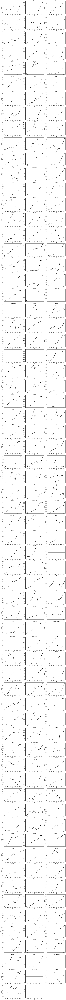

In [7]:
#This large set of simple plots will help me identify countries whose income values are problematic.
#I use a temporary interpolation to ensure that I can get at least some plot for every country in the dataframe

plots_by_country(df.interpolate(method="zero"), countries, "income")

As we can see above, there are several countries which simply do not have meaningful income data available.  There is no point in keeping these, so I have constructed a list of them by hand and will simply exclude them from the dataset

In [8]:
#Here, I'll subset the dataframe to exclude these countries

drop_list = ["Channel Islands","French Guiana","French Polynesia","Guadeloupe","Guam","Martinique","Mayotte",
             "Netherlands Antilles","New Caledonia","Reunion","Tokelau","Virgin Islands (U.S.)","Western Sahara","Åland",]

drop_index = df.index[df["country"].isin(drop_list)]

df = df.drop(drop_index)

In [9]:
#I need to recreate my countries list from earlier        

countries = []
for i in df["country"]:
    if i not in countries:
        countries.append(i)

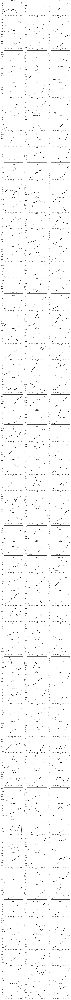

In [10]:
#And then I can recreate the set of income graphs to see if my income data now looks usable.  

plots_by_country(df, countries, "income")

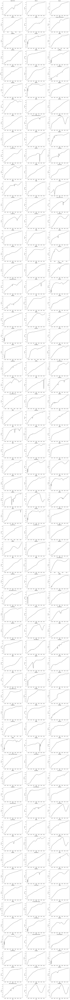

In [11]:
#And I might as well take a look at the life expectancy data in the same way:

plots_by_country(df, countries, "life exp")

In [12]:
#Finally, I'm going to construct a few more lists for future use:

years = []
for i in df["year"]:
    if i not in years:
        years.append(i)

regions = []
for i in df["region"]:
    if i not in regions:
        regions.append(i)

south_asia = []
for i in list(df[df["region"] == "South Asia"]["country"]):
    if i not in south_asia:
        south_asia.append(i)

europe_central_asia = []
for i in list(df[df["region"] == "Europe & Central Asia"]["country"]):
    if i not in europe_central_asia:
        europe_central_asia.append(i)
       
middle_east_north_africa = []
for i in list(df[df["region"] == "Middle East & North Africa"]["country"]):
    if i not in middle_east_north_africa:
        middle_east_north_africa.append(i)

sub_saharan_africa = []
for i in list(df[df["region"] == "Sub-Saharan Africa"]["country"]):
    if i not in sub_saharan_africa:
        sub_saharan_africa.append(i)

america = []
for i in list(df[df["region"] == "America"]["country"]):
    if i not in america:
        america.append(i)

east_asia_pacific = []
for i in list(df[df["region"] == "East Asia & Pacific"]["country"]):
    if i not in east_asia_pacific:
        east_asia_pacific.append(i)
        
years.sort()
        
region_sets = [south_asia, europe_central_asia, middle_east_north_africa, sub_saharan_africa, america, east_asia_pacific]

## Description

Now that my data is usable, I am going to take a brief look at what is in it.  In addition, I'll generate some descriptive statistics and use visualizations to get a sense for some key distributions.  

In [13]:
#A few important features of the data

print("countries: " + str(len(countries)))
print("regions: " + str(len(regions)))
print("first year: " + str(min(years)))
print("last year: " + str(max(years)))

countries: 183
regions: 6
first year: 1945
last year: 2015


In [14]:
#How about some descriptive statistics?

df.describe()

,year,life exp,income
count,12863.000000,12863.000000,12863.000000
mean,1980.005831,62.203132,10585.986317
std,20.420541,11.712206,15804.498191
min,1945.000000,10.836309,142.000000
25%,1962.000000,53.928440,1959.000000
50%,1980.000000,64.100000,4836.000000
75%,1998.000000,71.400000,12384.500000
max,2015.000000,84.100000,182668.000000


In [15]:
#Since I am interested in the relationship between life expectancy and income, I'll look at the correlation coefficient matrix

df.corr()

,year,life exp,income
year,1.000000,0.580618,0.274479
life exp,0.580618,1.000000,0.521134
income,0.274479,0.521134,1.000000


It's interesting to note that life expectancy is more strongly correlated to the year than it is to income, while income and year are strongly correlated (as we might expect).

Below, I'll use histograms to get a sense of my overall distributions:

Text(0.5,1,'Distribution of Life Expectancies')

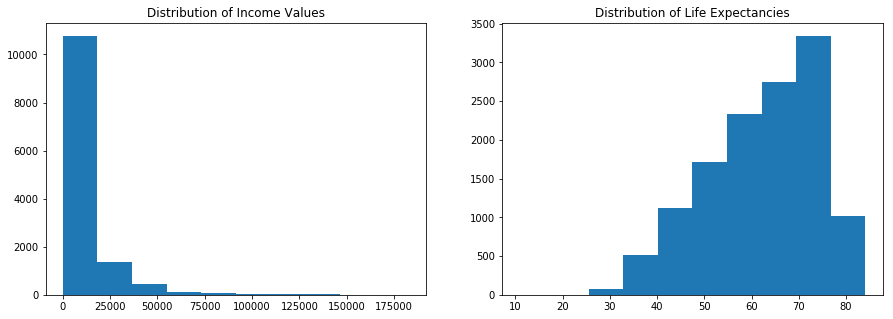

In [16]:
#Generate histograms for life expectancy and income

plt.figure(figsize=(15, 5))

plt.subplot(1,2,1)
plt.hist(df["income"])
plt.title("Distribution of Income Values")

plt.subplot(1,2,2)
plt.hist(df["life exp"])
plt.title("Distribution of Life Expectancies")

As we can see above, incomes are not at all normally distributed.  Instead, they are strongly right-skewed.  

The life expectancy data also shows some interesting characteristics: we have a large number of data points where the life expectancy is in the seventies, but when we look at the eighties, the number drops precipitously.  This may mark some threshold that is important in the life sciences, though it would be impossible to tell from this data alone.  

It's possible that a finer histogram would tell us more, but a histogram is perhaps not the best approach for this time-marked data.  Instead, I want to see a plot that shows how the distributions of these values have changed over time.

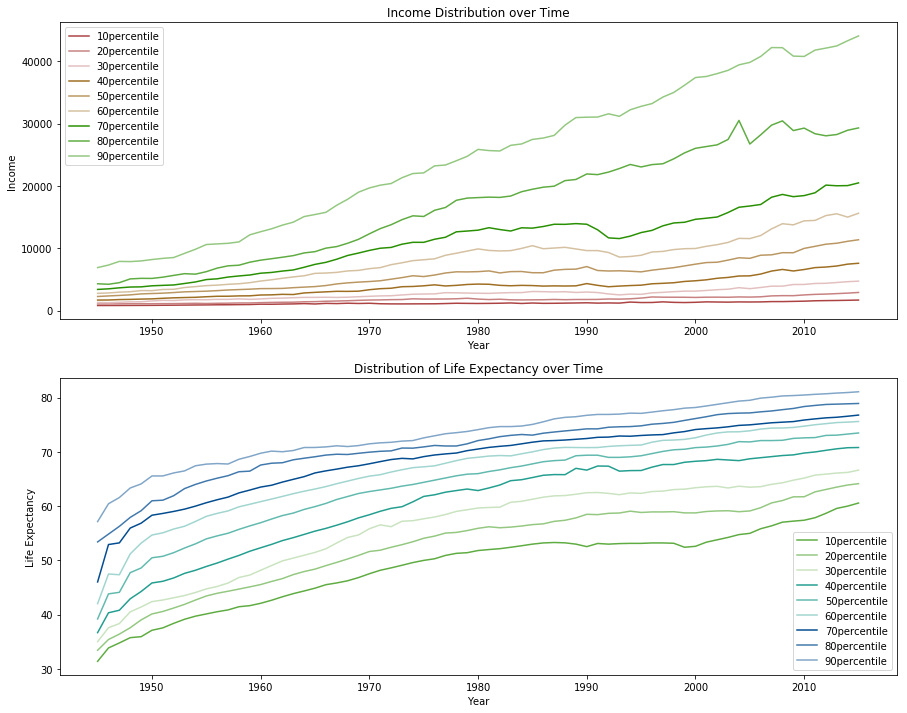

In [17]:
#Here, I plot percentiles over time for each data set

plt.figure(figsize=(15,12))
plt.subplot(2,1,1)
for i in [10, 20, 30, 40, 50, 60, 70, 80, 90]:
    plt.plot(years, [np.percentile(df[df["year"]==year]['income'], i) for year in years], 
         color = my_colors[int(i/10*2)], label = str(i) + "percentile")
plt.ylabel("Income")
plt.xlabel("Year")
plt.title("Income Distribution over Time")
plt.legend(loc="best")

plt.subplot(2,1,2)
for i in [10, 20, 30, 40, 50, 60, 70, 80, 90]:
    plt.plot(years, [np.percentile(df[df["year"]==year]['life exp'], i) for year in years], 
         color = my_colors[int(i/10*2)+14], label = str(i) + "percentile")
plt.ylabel("Life Expectancy")
plt.xlabel("Year")
plt.title("Distribution of Life Expectancy over Time")
plt.legend(loc="best")

Looking at the distributions over time gives us a picture of these two variables that matches up well with my expectation.  

Income has been growing for wealthier countries, but compared to those countries, it is growing very little for poorer countries.  We see an ever-widening wealthy gap between nations, and that gap is the most extreme at the top.

On the other hand, life expectancy has been growing much more steadily and across the board.  If anything, the distribution is somewhat tighter in 2015 than it was just after WWII.

This inconsistency between the income and life expectancy supports the notion, suggested by the correlation matrix above, that income actually isn't a strong predictor of life expectancy.  

## Initial Clustering and Exploration

One of the things I want to do is compare the K-means clustering method with more obvious clustering methods.  Specifically, I want to look at the data when clustered by region, as well as when clustered by relative income.  

In [18]:
#Here, I create a dataframe of regional means

df_region_means = pd.DataFrame(columns=["region", "year", "mean income", "mean life exp"])
for region in regions:
    for year in years:
        df_hold = pd.DataFrame({"region":[region],
                              "year":[year],
                              "mean income": [np.mean(list(df[(df["region"] == region)&(df["year"] == year)]["income"]))],
                              "mean life exp": [np.mean(list(df[(df["region"] == region)&(df["year"] == year)]["life exp"]))]
                               })
        df_region_means = df_region_means.append(df_hold, ignore_index=True)


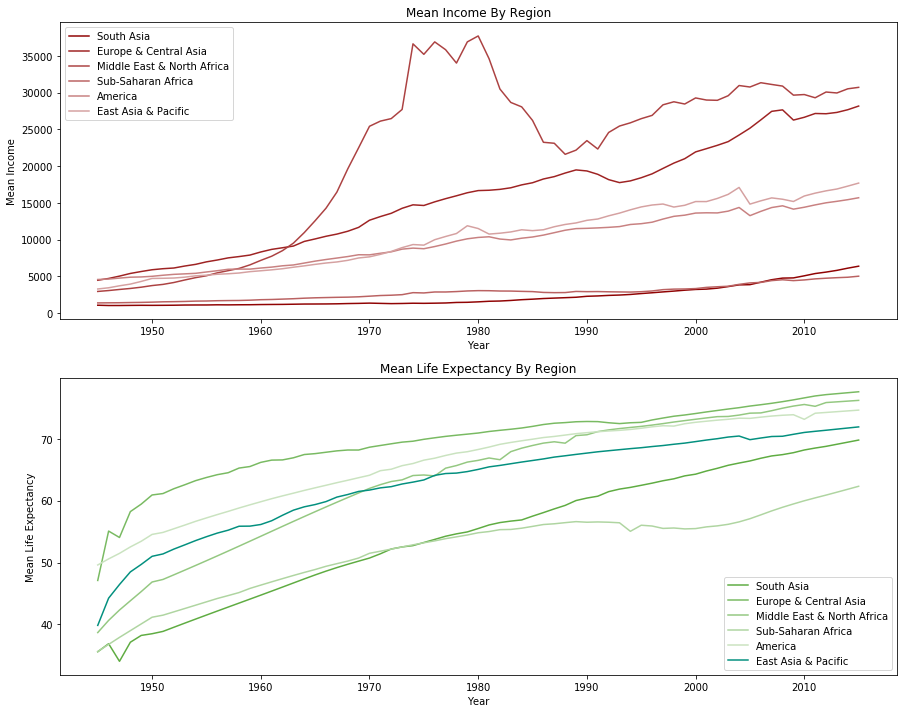

In [19]:
#To see how that came out, I look at some plots of regional means over time:

plt.figure(figsize=(15,12))

plt.subplot(2,1,1)
for i, region in enumerate(regions):
        plt.plot(list(df_region_means[df_region_means["region"] == region]["year"]), 
             list(df_region_means[df_region_means["region"] == region]["mean income"]), color = my_colors[i], label = region)
plt.xlabel("Year")
plt.ylabel("Mean Income")
plt.title("Mean Income By Region")
plt.legend(loc="best")

plt.subplot(2,1,2)
for i, region in enumerate(regions):
        plt.plot(list(df_region_means[df_region_means["region"] == region]["year"]), 
             list(df_region_means[df_region_means["region"] == region]["mean life exp"]), color = my_colors[i+16], label = region)
plt.xlabel("Year")
plt.ylabel("Mean Life Expectancy")
plt.title("Mean Life Expectancy By Region")
plt.legend(loc="best")

The regional mean plots above look much as we'd expect.  However, the "Middle East & North Africa" region plot shows an odd pattern that I've seen earlier in the by-country plots.

To get a better look at what's going on, here, let's look at individual nations' incomes plotted by region:

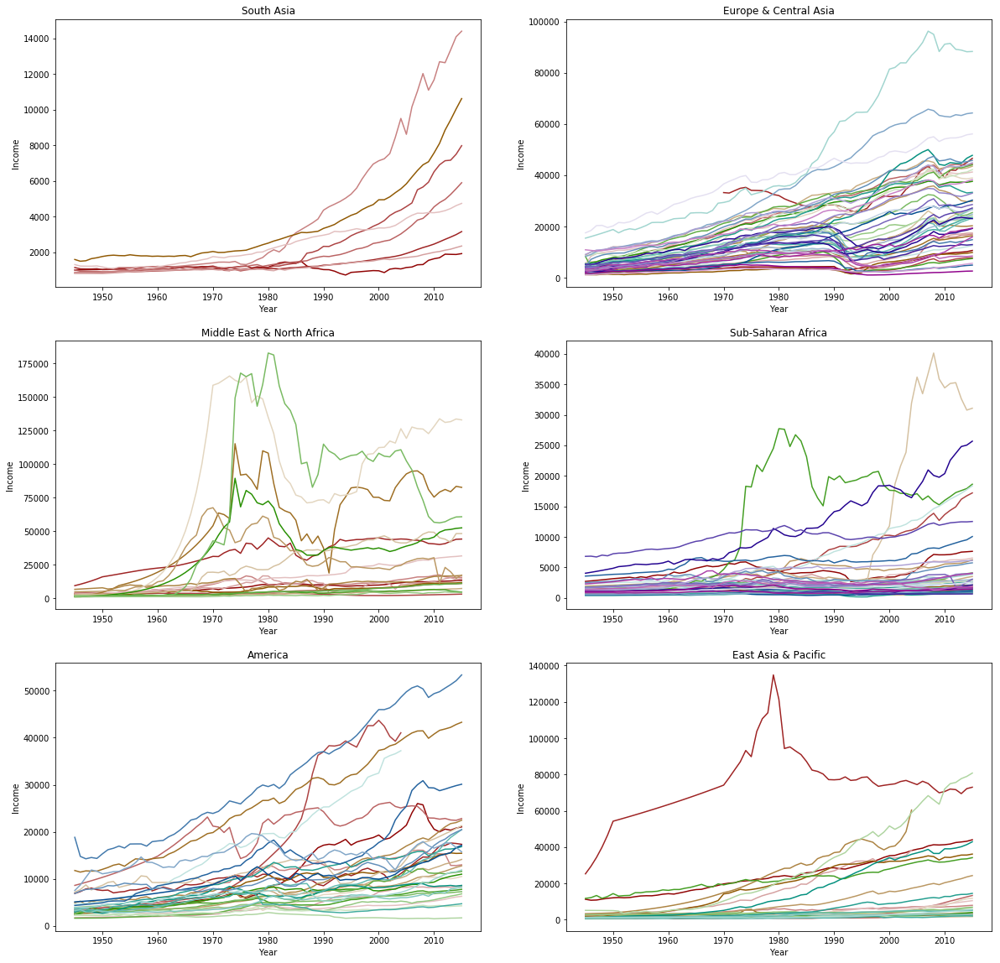

In [20]:
#plot individual countries by region

plt.figure(figsize=(20,20))
for i, region in enumerate(region_sets):
    plt.subplot(3,2,i+1)
    for j, country in enumerate(region):
        plt.plot(list(df[df["country"] == country]["year"]), 
                list(df[df["country"] == country]["income"]), color = my_colors[j], label = country)
    plt.xlabel("Year")
    plt.ylabel("Income")
    plt.title(regions[i])

In the plots above, we can begin to see some interesting outliers: the set of nations in the middle east and north Africa that have massive plateaus in the 70s and 80s (likely oil-rich states like Saudi Arabia), the one massively wealthy nation in east Asia and the Pacific (I'm guessing Japan?) and a couple of outlier states in Sub-Saharan Africa (one is probably South Africa, but I have no idea what the other might be).  

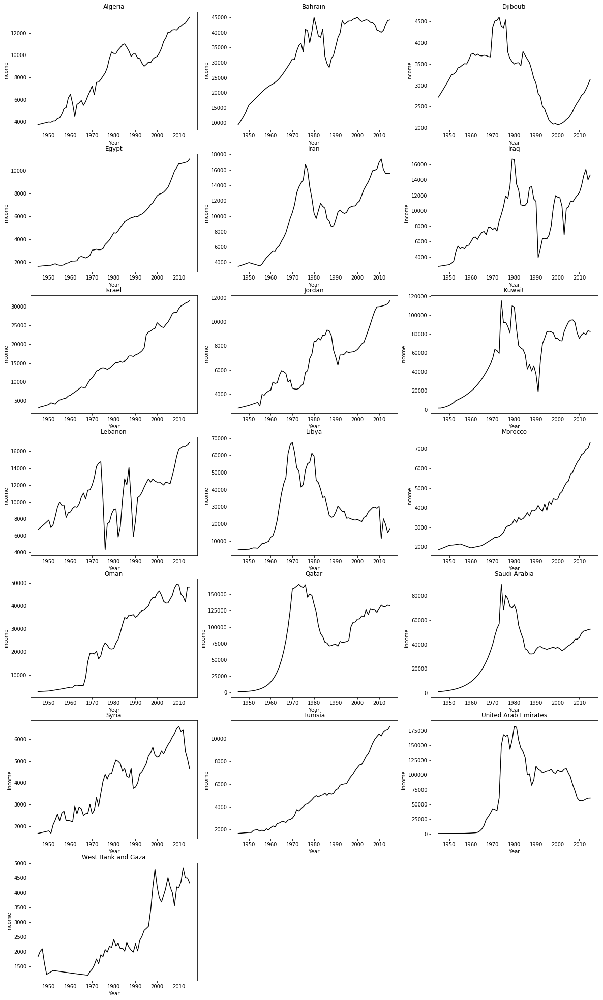

In [21]:
#I can explore further by recalling the plots_by_country function used above:

plots_by_country(df, middle_east_north_africa, "income")

Indeed, we see a number of oil-producing nations reaching peaks around 1975 or 1980.  They all suffer a distinct crash in the nineties, but while some (like Kuwait) seem to have recovered, others, like Djibouti, were much harder hit.  I'd be interested to see what was happening between 1990 and 2000 in Djibuti that might explain why their recovery is so different from that of other nations with similar mid-seventies booms.  

I'm also interested in the particularly high-earning countries in Sub-Saharan Africa, East Asia, and the Pacific.  Below, I construct a list of top-earning countries in each region and plot them against each other.

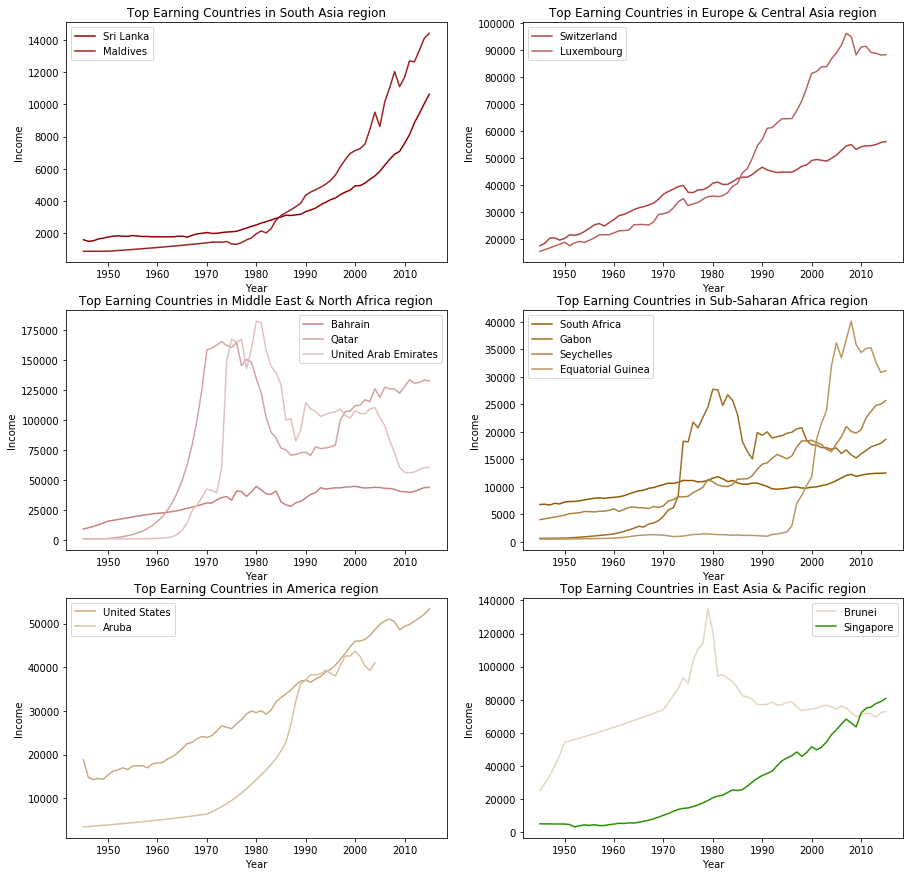

In [22]:
#Construct the list

inc_top = []
for region in regions:
    for year in years:
        country = list(df[(df["region"] == region)&(df["year"] == year)].sort_values("income", ascending=False)["country"])[0]
        if country not in inc_top:
            inc_top.append(country)

#Plot the top-earners against each other by region
            
plt.figure(figsize=(15,15))
for i, region in enumerate(regions):
    plt.subplot(3,2,i+1)
    for j, country in enumerate(inc_top):
        if country in list(df[df["region"]==region]["country"]):
            plt.plot(df[(df["country"]==country) & (df["region"]==region)]["year"],
                 df[(df["country"]==country) & (df["region"]==region)]["income"], 
                 color=my_colors[j], label = country)
    plt.xlabel("Year")
    plt.ylabel("Income")
    plt.title("Top Earning Countries in " + region + " region")
    plt.legend(loc="best")      

Each of these plots represents the income over time for each nation which had the highest income for its region for any year in the period of interest.  The plots are revealing.  I had known, for instance, that average income in Singapore had been doing well, but I had not considered Brunei--another oil-rich nation which saw a massive spike in the late seventies.  It is interesting to see, for instance, countries with relatively stable incomes, like South Africa, being overtaken by nations experiencing massive growth spurts, like Gabon and the Seychelles.  It not only makes one wonder what happened, for instance, in the Seychelles in the late nineties, but also what that sort of impact that economic growth has on life expectancy?  

I won't be looking specifically at countries that experience massive income growth, but it is something that might be interesting to look at later on.  

This "regional leaders" approach is one way to produce a cluster of particularly wealthy nations for later analysis, but I also want a cluster of high-earning countries which is not affected by region.


In [23]:
#Here, I construct a list of all of the countries which make it into the top fifth percentile during any year

inc_high = []

for year in years:
    percentile = np.percentile(df[df["year"]==year]['income'], 94)
    df_hold = list(df[(df["income"]>percentile)&(df["year"]==year)]["country"])
    for country in df_hold:
        if country not in inc_high:
            inc_high.append(country)
print(inc_high)
print(len(inc_high))

['Australia', 'Bahrain', 'Brunei', 'Canada', 'Denmark', 'Luxembourg', 'New Zealand', 'Sweden', 'Switzerland', 'United Kingdom', 'United States', 'Norway', 'Venezuela', 'Kuwait', 'Bahamas', 'Qatar', 'Libya', 'Saudi Arabia', 'United Arab Emirates', 'Andorra', 'Oman', 'Macao, China', 'Aruba', 'Singapore', 'Ireland', 'Netherlands']
26


['Burkina Faso', 'Burundi', 'China', 'Equatorial Guinea', 'Ethiopia', 'Lesotho', 'Malawi', 'Mozambique', 'Rwanda', 'Guinea', 'Timor-Leste', 'Mali', 'Cape Verde', 'Solomon Islands', 'Eritrea', 'Uganda', 'Somalia', 'Cambodia', 'Chad', 'Liberia', 'Niger', 'Afghanistan', 'Congo, Dem. Rep.', 'Sierra Leone']
24


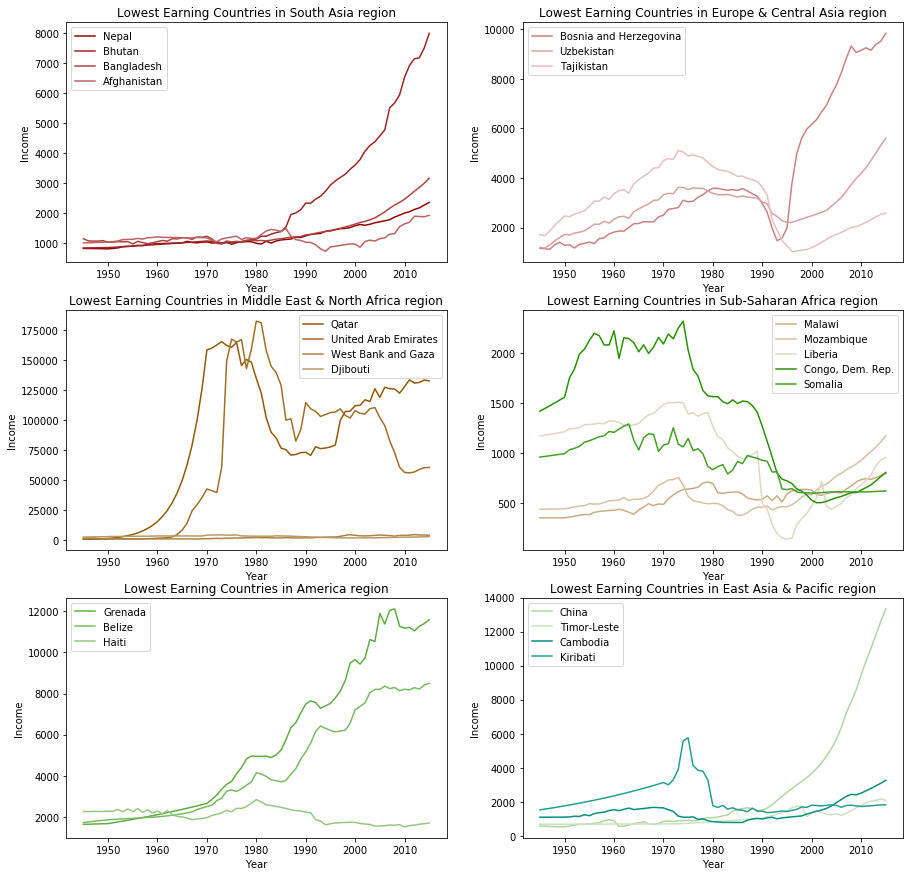

In [24]:
#Now, to produce the opposite numbers for each of the clusters above:

inc_low = []

for year in years:
    percentile = np.percentile(df[df["year"]==year]['income'], 5)
    df_hold = list(df[(df["income"]<percentile)&(df["year"]==year)]["country"])
    for country in df_hold:
        if country not in inc_low:
            inc_low.append(country)
print(inc_low)
print(len(inc_low))

inc_bot = []
for region in regions:
    for year in years:
        country = list(df[(df["region"] == region)&(df["year"] == year)].sort_values("income", ascending=True)["country"])[0]
        if country not in inc_bot:
            inc_bot.append(country)
            
#Here, I produce plots comparable to those above
            
plt.figure(figsize=(15,15))
for i, region in enumerate(regions):
    plt.subplot(3,2,i+1)
    for j, country in enumerate(inc_bot):
        if country in list(df[df["region"]==region]["country"]):
            plt.plot(df[(df["country"]==country) & (df["region"]==region)]["year"],
                 df[(df["country"]==country) & (df["region"]==region)]["income"], 
                 color=my_colors[j], label = country)
    plt.xlabel("Year")
    plt.ylabel("Income")
    plt.title("Lowest Earning Countries in " + region + " region")
    plt.legend(loc="best")      

Fascinatingly, both the UAE and Qatar show up both in the cluster of highest-earning countries and the cluster of lowest-earning countries.  

## K-means Clustering

Next, I want to divide the dataset into clusters using the KMeans method. However, since my goal is to get clusters of countries, rather than clusters of individual observations, I'll need a restructured dataframe.  Specifically, I'll need one wherein each country is an observation, with columns representing the years.  Since I will later be treating life expectancy as a response variable, I just want to cluster the countries by their income at each year, without taking life expectancy into account.

To complicate matters, some countries don't have income data for every year, as we can see below:

In [25]:
#Here, I construct the pivoted income dataframe and pull up a list of countries with missing data values

dfp_inc = df.pivot(index='country', columns='year')['income']
dfp_inc[(dfp_inc[1945].isna())|(dfp_inc[2015].isna())]

year,1945,1946,1947,1948,1949,1950,1951,1952,1953,1954,...,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015
country,,,,,,,,,,,,,,,,,,,,,
Andorra,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,42738.0,43442.0,41426.0,41735.0,38982.0,41958.0,41926.0,43735.0,44929.0,46577.0
Aruba,3443.0,3530.0,3618.0,3709.0,3801.0,3897.0,3994.0,4094.0,4196.0,4301.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Dominica,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,9172.0,9713.0,10425.0,10289.0,10375.0,10333.0,10149.0,10011.0,10207.0,10503.0
Greenland,2864.0,2954.0,3047.0,3143.0,3242.0,3344.0,3532.0,3730.0,3940.0,4161.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"Hong Kong, China",3160.0,3202.0,3246.0,3290.0,3335.0,3381.0,3494.0,3615.0,3736.0,3864.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"Macao, China",3269.0,3360.0,3454.0,3550.0,3649.0,3751.0,4019.0,4307.0,4616.0,4946.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Marshall Islands,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3333.0,3454.0,3378.0,3316.0,3514.0,3510.0,3672.0,3776.0,3638.0,3661.0
Puerto Rico,4598.0,4700.0,4804.0,4910.0,5018.0,5129.0,5277.0,5603.0,5913.0,6129.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [26]:
#to fix dfp_inc, we'll use linear interpolation.  
#The frame must be sorted to interpolate both forwards and backwards.

dfp_inc = dfp_inc.interpolate(method="linear", axis=1).sort_index(axis=1, ascending=False).interpolate(method="linear", axis=1).sort_index(axis=1)

Text(0.5,1,'Elbow Plot for K selection')

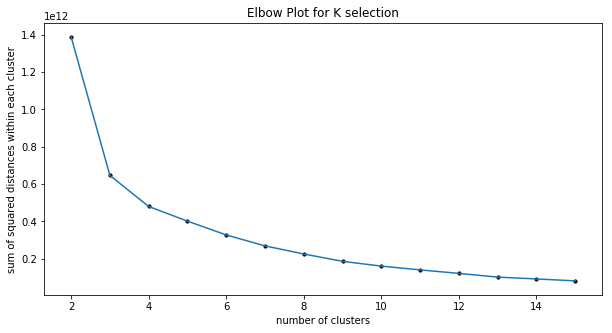

In [27]:
#I'll use an elbow plot to pick a number of centroids for the K-means process
ks = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
inertias = []
for k in ks:
    inertias.append(KMeans(n_clusters=k, random_state=0).fit(dfp_inc).inertia_)
    
plt.figure(figsize=(10,5))
plt.plot(ks, inertias)
plt.scatter(ks, inertias, s=10, c="black")
plt.xlabel("number of clusters")
plt.ylabel("sum of squared distances within each cluster")
plt.title("Elbow Plot for K selection")

In [28]:
#It looks like four centroids is a good number, so I'll go ahead and create the model
model = KMeans(n_clusters=4, random_state=0).fit(dfp_inc)

In [29]:
#Here, I attach the cluster to the dataframe
dfp_inc["cluster"] = list(model.labels_)

#...and then construct a list of countries for each of my four clusters

cluster0 = list(dfp_inc[dfp_inc["cluster"]==0].index)
cluster1 = list(dfp_inc[dfp_inc["cluster"]==1].index)
cluster2 = list(dfp_inc[dfp_inc["cluster"]==2].index)
cluster3 = list(dfp_inc[dfp_inc["cluster"]==3].index)

Text(0.5,1,'Cluster 3')

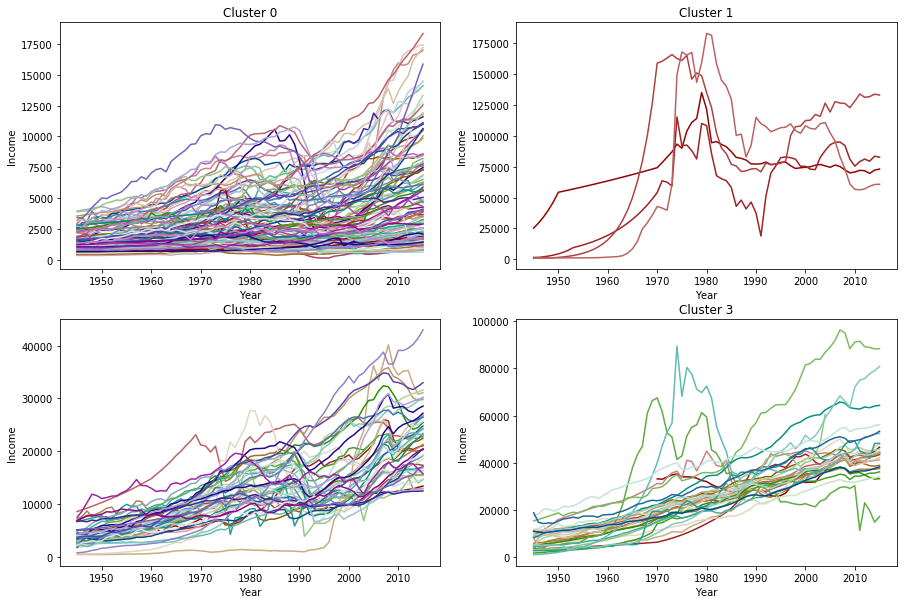

In [30]:
#Now, let's take a look at how these clusters shaped up

plt.figure(figsize=(15, 10))

plt.subplot(2,2,1)
for i, country in enumerate(cluster0):
    plt.plot(list(df[df["country"] == country]["year"]), 
            list(df[df["country"] == country]["income"]), color = my_colors[i%len(my_colors)], label = country)
plt.xlabel("Year")
plt.ylabel("Income")
plt.title("Cluster 0")

plt.subplot(2,2,2)
for i, country in enumerate(cluster1):
    plt.plot(list(df[df["country"] == country]["year"]), 
            list(df[df["country"] == country]["income"]), color = my_colors[i%len(my_colors)], label = country)
plt.xlabel("Year")
plt.ylabel("Income")
plt.title("Cluster 1")

plt.subplot(2,2,3)
for i, country in enumerate(cluster2):
    plt.plot(list(df[df["country"] == country]["year"]), 
            list(df[df["country"] == country]["income"]), color = my_colors[i%len(my_colors)], label = country)
plt.xlabel("Year")
plt.ylabel("Income")
plt.title("Cluster 2")

plt.subplot(2,2,4)
for i, country in enumerate(cluster3):
    plt.plot(list(df[df["country"] == country]["year"]), 
            list(df[df["country"] == country]["income"]), color = my_colors[i%len(my_colors)], label = country)
plt.xlabel("Year")
plt.ylabel("Income")
plt.title("Cluster 3")
        

In [31]:
#Check to see which four countries comprise cluster 1

cluster1

['Brunei', 'Kuwait', 'Qatar', 'United Arab Emirates']

The clusters here are interesting.  Cluster 0 is massive, and all over the place.  Cluster 2 has a pretty tight band of countries with similar income progressions through the middle, but with a few oddballs.  Cluster 1 is surprisingly small, with only four members: four oil-rich nations which appear to be very wealthy.  

So, now that I have four clustering schemes:
 - by region
 - top / bottom
 - high / low
 - KMeans

It's time to look at some simple regression analysis to see how income bears on life expectancy.

## Regression Analysis

To start, let's take a look at a basic regression analysis taking all of the data into account.  The goal here is not to do a time-series analysis: I will treat each data point independently. I also don't want to use the values I interpolated for the clustering exercise, here, so I'll be using the df dataframe rather than dfp_inc.

In [32]:
#first, I sort the dataframe by income. This will improve plotting later
df = df.sort_values("income")

inc_list = list(df["income"])
life_list = list(df["life exp"])

#then, since LinearRegression expects a 2d array for explanatory variables, I convert inc_list to the 2d inc_array
inc_array = np.reshape(inc_list, (-1,1))

#next, I fit the model
lin_model = LinearRegression()
lin_model.fit(inc_array, life_list)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [33]:
#Now to evaluate the model. I start by generating an R-squared score for the model's predictions:

lin_model.score(inc_array, life_list)

0.2715802463077618

Much as expected, at this point, the R-squared score is low, indicating a weak relationship between these two variables across the entire data set, or, perhaps, that a linear model is not a good fit for the data.  

To find out, I will take a look at my residuals.

Text(0.5,1,'Linear Regression Model')

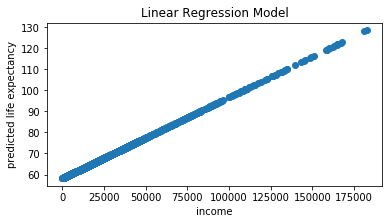

In [34]:
#I generate a list of predictions, then plot those predictions

predictions = lin_model.predict(inc_array)

plt.figure(figsize=(6,3))
plt.scatter(inc_list, predictions)
plt.xlabel("income")
plt.ylabel("predicted life expectancy")
plt.title("Linear Regression Model")

As expected, a nice straight line from our linear model.

Text(0.5,1,'Linear Regression Residuals plot')

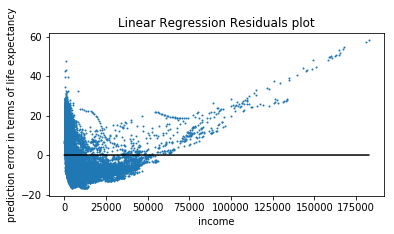

In [35]:
#Then, I generate and plot a list of errors

errors = predictions - life_list

plt.figure(figsize=(6, 3))
plt.scatter(inc_list, errors, s=1)
plt.plot(inc_list, np.zeros(len(inc_list)), color="black")
plt.xlabel("income")
plt.ylabel("prediction error in terms of life expectancy")
plt.title("Linear Regression Residuals plot")

For linear regression, we want these errors to be normally distributed around zero.  As we can see, these are certainly not, which indicates that this linear model is not a good fit for our dataset. To pick a better one, I'll create a scatter plot showing income vs. life expectancy directly. 

Text(0,0.5,'life expectancy')

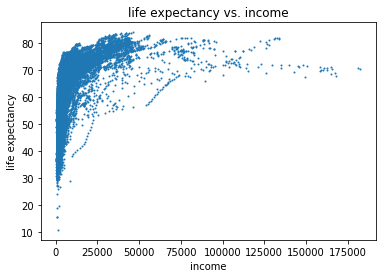

In [36]:
plt.scatter(inc_list, life_list, s=1)
plt.title("life expectancy vs. income")
plt.xlabel("income")
plt.ylabel("life expectancy")

It is clear that the income and life expectancy are not linearly related, but it looks like life expectancy might be linearly related to the logarithm of income.  Below, I examine that possibility.

Text(0,0.5,'life expectancy')

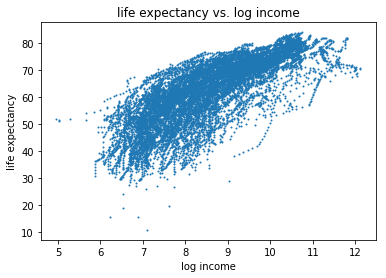

In [37]:
#Generate the list of the  natural logs of the incomes

inc_log_list = np.log(inc_list)

#and plot them against life expectancy

plt.scatter(inc_log_list, life_list, s=1)
plt.title("life expectancy vs. log income")
plt.xlabel("log income")
plt.ylabel("life expectancy")

So, we don't have a nice neat line, but this relationship is, as expected much more linear.  I'll re-run the regression again using the natural logs of the incomes and see how that relationship pans out.

R-squared = 0.6030387731579417


Text(0.5,1,'Linear Regression Residuals plot (logarithmic)')

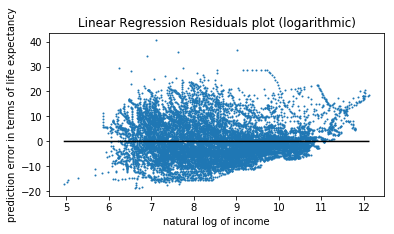

In [38]:
#Construct the 2d inc_log array

inc_log_array = np.reshape(inc_log_list, (-1,1))

#Fit the model:
lin_model_log = LinearRegression()
lin_model_log.fit(inc_log_array, life_list)

#print the correlation coefficient
overall_log_model_rsquared = lin_model_log.score(inc_log_array, life_list)
print("R-squared = " + str(overall_log_model_rsquared))

#construct and plot the residuals
predictions_log = lin_model_log.predict(inc_log_array)
errors_log = predictions_log - life_list

plt.figure(figsize=(6, 3))
plt.scatter(inc_log_list, errors_log, s=1)
plt.plot(inc_log_list, np.zeros(len(inc_log_list)), color="black")
plt.xlabel("natural log of income")
plt.ylabel("prediction error in terms of life expectancy")
plt.title("Linear Regression Residuals plot (logarithmic)")

Alright, so this looks much better.  Our residuals may not be quite normally distributed (there appear to be more extreme positive values than negative ones) and our distribution may not be quite homogeneous (it may trend upward slightly as income increases), but this is close enough for my purposes at this point.  It was never a given that there was a strong or clear relationship between these two variables, and I am more interested to see how the relationships appear in the various clusters I picked out in the last section.  This gives a good baseline for moving forward.  

Before looking at the clusters, though, let's have a quick look at the plot of the regression model against the actual data:

Text(0,0.5,'life expectancy')

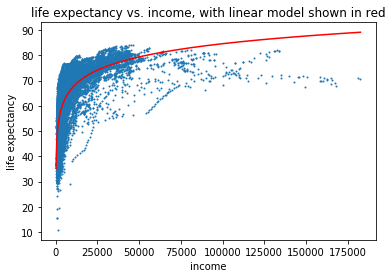

In [39]:
plt.scatter(inc_list, life_list, s=1)
plt.plot(inc_list, predictions_log, color="red")
plt.title("life expectancy vs. income, with linear model shown in red")
plt.xlabel("income")
plt.ylabel("life expectancy")

The fit here isn't terrible, but we can see how the model's predictions start to land firmly on the high side as income increases.  Let's see if we can do better by focusing on smaller clusters of countries instead of the entire dataset.  

First, I'll want to evaluate for each cluster whether the income values need to be transformed, as they were here.  We'll start by looking at clustering by region.

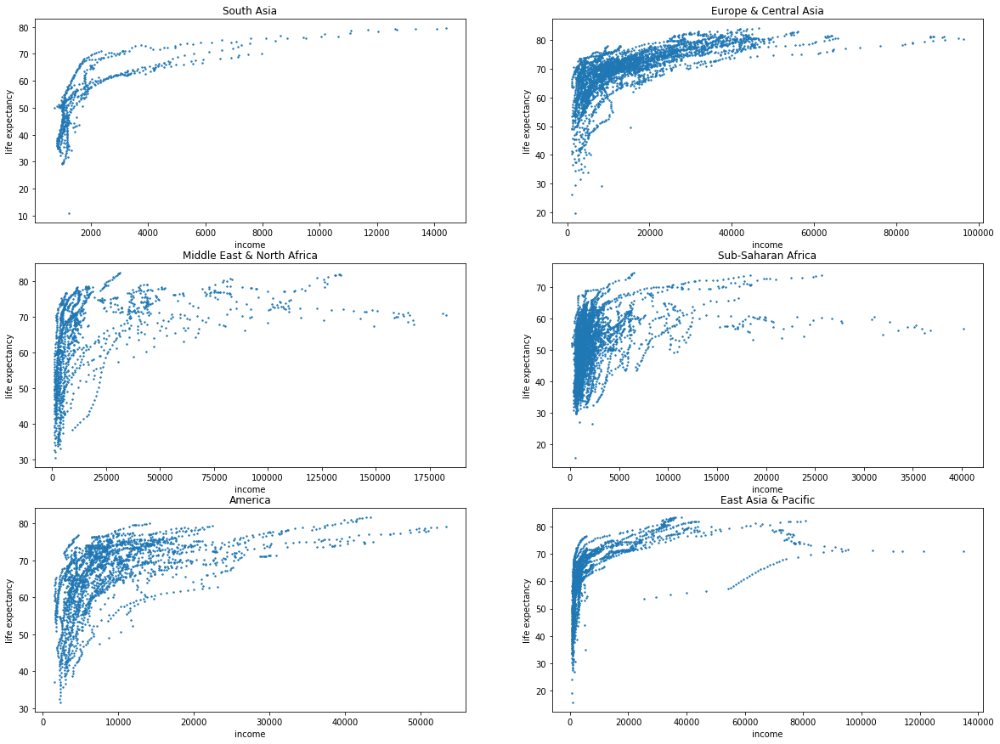

In [40]:
#construct scatter plots of income vs. life expectancy per region
plt.figure(figsize=(20,15))
for i, region in enumerate(regions):
    plt.subplot(3,2,i+1)
    plt.scatter(df[df["region"]==region]["income"], df[df["region"]==region]["life exp"], s=2)
    plt.xlabel("income")
    plt.ylabel("life expectancy")
    plt.title(regions[i])

Pretty clearly, these will all require the logarithmic transformation.  I'll reproduce the regression process above for each of the six regions.

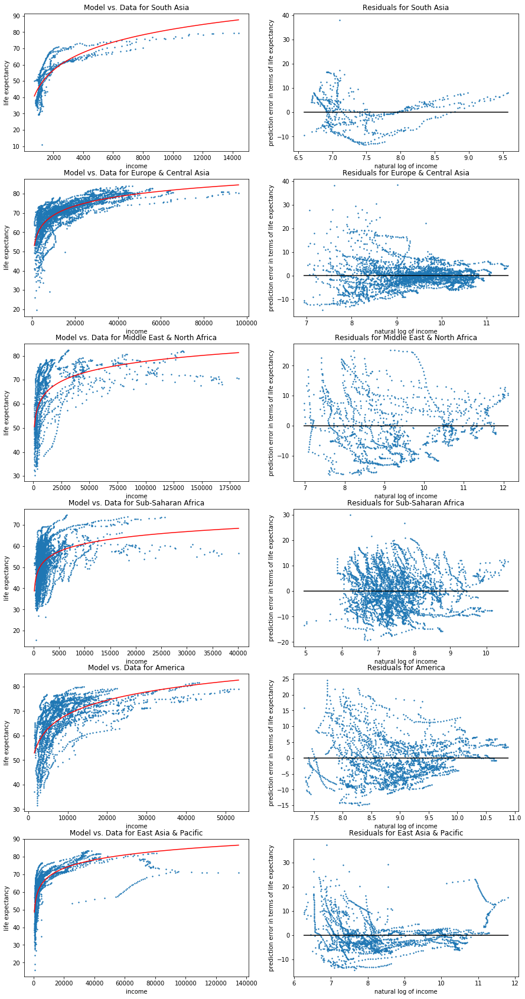

In [41]:
region_rsquared_list = []
plt.figure(figsize=(15,30))
for i, region in enumerate(regions):
    #assemble the basic data objects
    df_hold = df[df["region"]==region].sort_values("income")
    inc_list = list(df_hold["income"])
    life_list = list(df_hold["life exp"])
    inc_array = np.reshape(np.log(inc_list), (-1,1))
    
    #fit the model
    model = LinearRegression()
    model.fit(inc_array, life_list)
    
    #store the correlation coefficient for later use
    rsquared = model.score(inc_array, life_list)
    region_rsquared_list.append(rsquared)
    
    #construct residuals
    predictions = model.predict(inc_array)
    errors = predictions - life_list
    
    #plot the model vs the data
    plt.subplot(6, 2, i*2+1)
    plt.scatter(inc_list, life_list, s=2)
    plt.plot(inc_list, predictions, color="red")
    plt.title("Model vs. Data for " + region)
    plt.xlabel("income")
    plt.ylabel("life expectancy")
    
    #plot the residuals
    plt.subplot(6,2,i*2+2)
    plt.scatter(np.log(inc_list), errors, s=2)
    plt.plot(np.log(inc_list), np.zeros(len(inc_list)), color="black")
    plt.xlabel("natural log of income")
    plt.ylabel("prediction error in terms of life expectancy")
    plt.title("Residuals for " + region)



Much as with the full dataset, we see that linear models by region produce decent, but unspectacular results. The model fails dramatically for what looks like two or three countries in East Asia and the Pacific, and shows an overestimation problem for high-income points, like what we saw with the full data, in all six regions.  The residual plots are not bad, but Southeast Asian and, to a lesser extent, East Asian and the Pacific show concerning "u-shaped" patterns, while America, the Middle East and North Africa, and Europe and Central Asia show some heterogeneity of variance in the residual plot.  It's clear that even with the logarithmic transformation, linear modeling is only a mediocre fit for this regional data.  

However, I still want to see whether this holds for the other categories of countries I've picked out.  Next up are the top / bottom and high / low clusters.   

Text(0.5,1,'life expectancy vs income for low-earning countries')

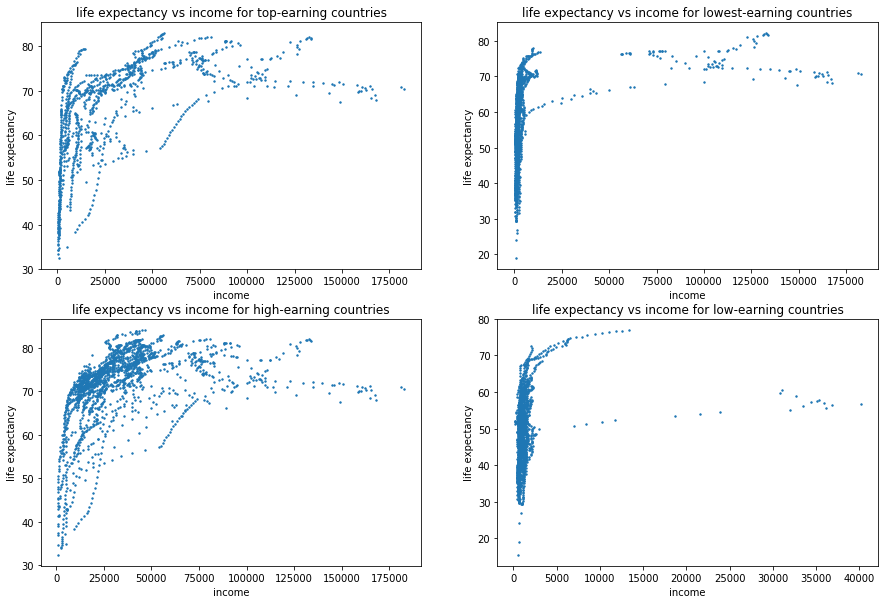

In [42]:
plt.figure(figsize=(15,10))
#for top-earning countries
plt.subplot(2,2,1)
plt.scatter(df[df["country"].isin(inc_top)]["income"], df[df["country"].isin(inc_top)]["life exp"], s=2)
plt.xlabel("income")
plt.ylabel("life expectancy")
plt.title("life expectancy vs income for top-earning countries")

#for bottom-earning countries
plt.subplot(2,2,2)
plt.scatter(df[df["country"].isin(inc_bot)]["income"], df[df["country"].isin(inc_bot)]["life exp"], s=2)
plt.xlabel("income")
plt.ylabel("life expectancy")
plt.title("life expectancy vs income for lowest-earning countries")

#for high-earning countries
plt.subplot(2,2,3)
plt.scatter(df[df["country"].isin(inc_high)]["income"], df[df["country"].isin(inc_high)]["life exp"], s=2)
plt.xlabel("income")
plt.ylabel("life expectancy")
plt.title("life expectancy vs income for high-earning countries")

#for low-earning countries
plt.subplot(2,2,4)
plt.scatter(df[df["country"].isin(inc_low)]["income"], df[df["country"].isin(inc_low)]["life exp"], s=2)
plt.xlabel("income")
plt.ylabel("life expectancy")
plt.title("life expectancy vs income for low-earning countries")

Recall that the "top-earning" category represents the set of countries which were the top earners in their respective regions at any time, while the "high-earning" countries are those who were in the top five percent of all countries at any time.  In a similar vein, "lowest-earning" countries are those who ever took the lowest spot in their region, while "low-earning" are those who ever fell into the lowest five percent overall.

Clearly, all of these will also require the logarithmic transformation.  The lower-earning categories are far more tightly clustered, but that is to be expected (since that clustering is a result of similar income values).  What is more interesting is that we can see, in the plots for the higher-earning clusters, a transition from a positive relationship between income and life expectancy to a negative relationship as wealth passes over a certain point.  This is the same behavior that threw off the model for the overall data, and it suggests that perhaps there is a point where income actually starts to harm health outcomes.  

It's possible that we might capture this with a polynomial model, but that's not something I'm going to dig into in this kernel.

Next up, I want to look at the models and residual plots for each of these four categories.  To make that easier, I'll start by adapting the code I used for the regional models above into a function that can handle the plots for a single category and return the rsquared value for that category's model for later use.  

In [43]:
#define the 
def log_model_plots(cluster, title):
    plt.figure(figsize=(15,5))
    #assemble the basic data objects
    df_hold = df[df["country"].isin(cluster)].sort_values("income")
    inc_list = list(df_hold["income"])
    life_list = list(df_hold["life exp"])
    inc_array = np.reshape(np.log(inc_list), (-1,1))
    
    #fit the model
    model = LinearRegression()
    model.fit(inc_array, life_list)
    
    #store the correlation coefficient for later use
    rsquared = model.score(inc_array, life_list)
       
    #construct residuals
    predictions = model.predict(inc_array)
    errors = predictions - life_list
  
    #plot the model vs the data
    plt.subplot(1, 2, 1)
    plt.scatter(inc_list, life_list, s=2)
    plt.plot(inc_list, predictions, color="red")
    plt.title("Model vs. Data for " + title)
    plt.xlabel("income")
    plt.ylabel("life expectancy")
   
    #plot the residuals
    plt.subplot(1, 2, 2)
    plt.scatter(np.log(inc_list), errors, s=2)
    plt.plot(np.log(inc_list), np.zeros(len(inc_list)), color="black")
    plt.xlabel("natural log of income")
    plt.ylabel("prediction error in terms of life expectancy")
    plt.title("Residuals for " + title)
    
    return model.score(inc_array, life_list)

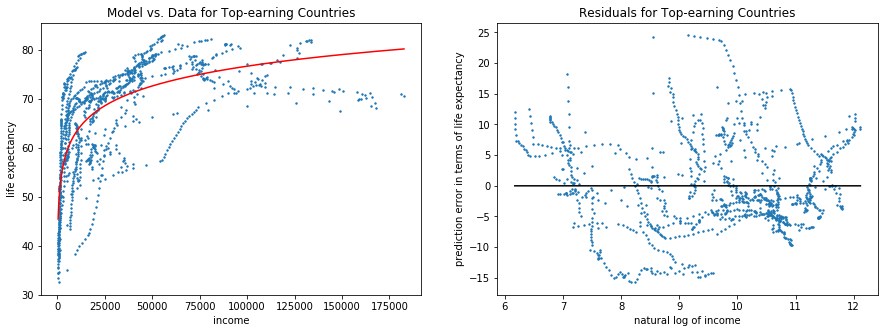

In [44]:
inc_top_rsquared = log_model_plots(inc_top, "Top-earning Countries")

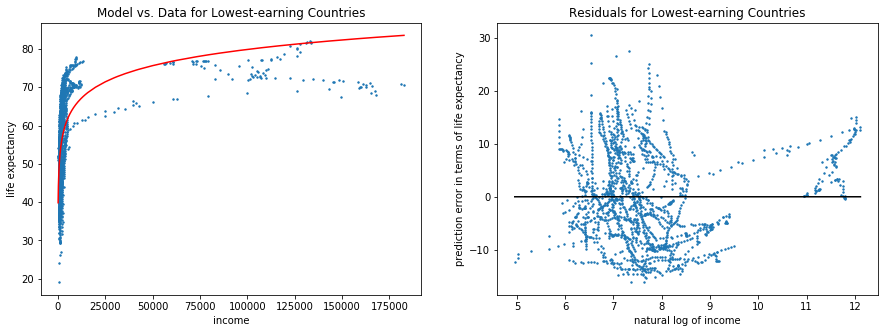

In [45]:
inc_bot_rsquared = log_model_plots(inc_bot, "Lowest-earning Countries")

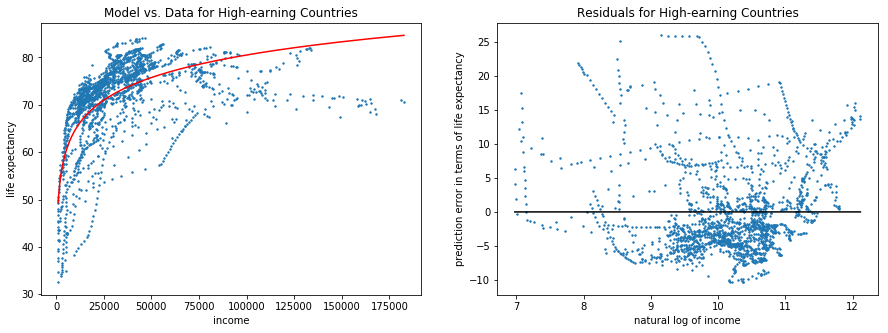

In [46]:
inc_high_rsquared = log_model_plots(inc_high, "High-earning Countries")

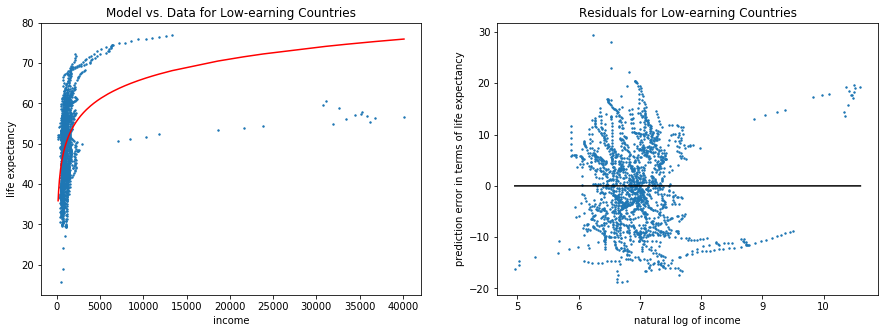

In [47]:
inc_low_rsquared = log_model_plots(inc_low, "Low-earning Countries")

It's interesting that in all four cases, we can see the model being pulled down by what looks like one or just a few countries that saw massive incomes without correspondingly high life expectancies.

Now, to repeat the process for the four clusters generated by KMeans.

Text(0.5,1,'life expectancy vs income for Cluster 3')

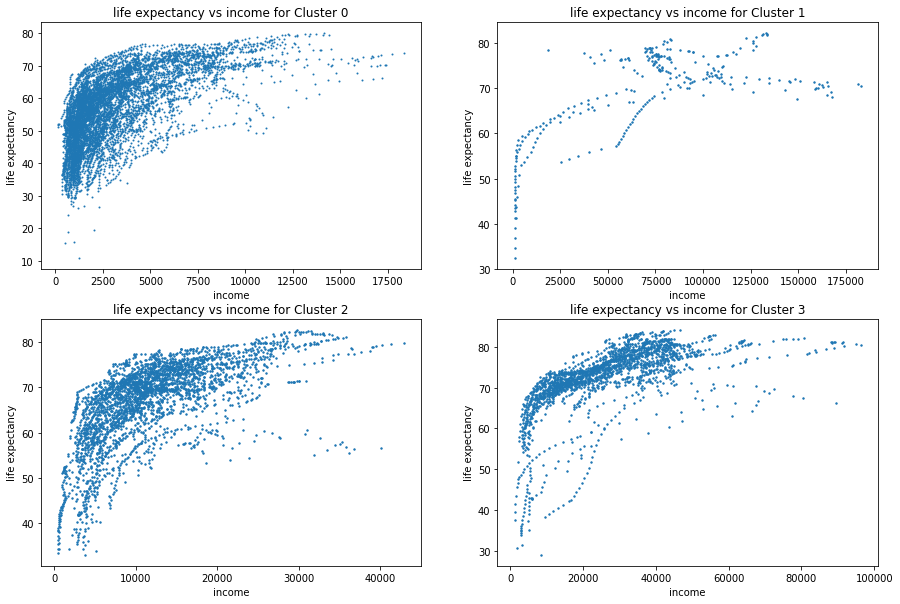

In [48]:
plt.figure(figsize=(15,10))
#for top-earning countries
plt.subplot(2,2,1)
plt.scatter(df[df["country"].isin(cluster0)]["income"], df[df["country"].isin(cluster0)]["life exp"], s=1)
plt.xlabel("income")
plt.ylabel("life expectancy")
plt.title("life expectancy vs income for Cluster 0")

#for bottom-earning countries
plt.subplot(2,2,2)
plt.scatter(df[df["country"].isin(cluster1)]["income"], df[df["country"].isin(cluster1)]["life exp"], s=2)
plt.xlabel("income")
plt.ylabel("life expectancy")
plt.title("life expectancy vs income for Cluster 1")

#for high-earning countries
plt.subplot(2,2,3)
plt.scatter(df[df["country"].isin(cluster2)]["income"], df[df["country"].isin(cluster2)]["life exp"], s=2)
plt.xlabel("income")
plt.ylabel("life expectancy")
plt.title("life expectancy vs income for Cluster 2")

#for low-earning countries
plt.subplot(2,2,4)
plt.scatter(df[df["country"].isin(cluster3)]["income"], df[df["country"].isin(cluster3)]["life exp"], s=2)
plt.xlabel("income")
plt.ylabel("life expectancy")
plt.title("life expectancy vs income for Cluster 3")

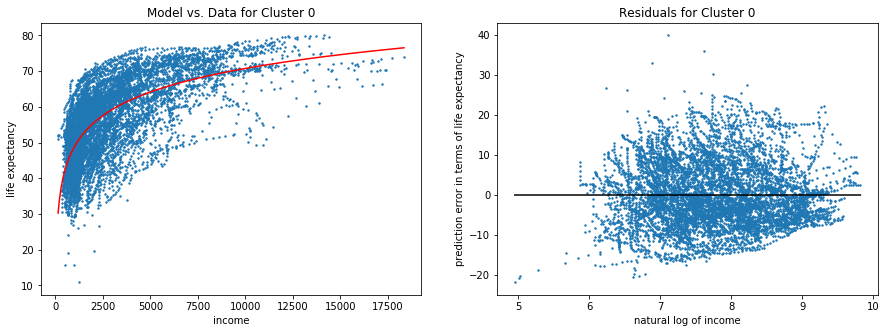

In [49]:
#Create the model and residual plots for cluster 0
c0_rsquared = log_model_plots(cluster0, "Cluster 0")

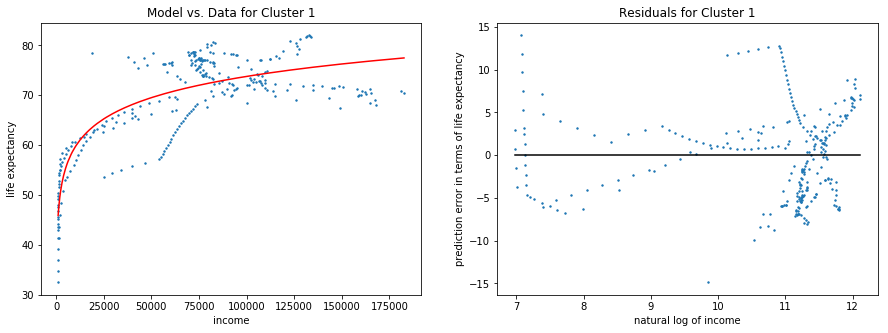

In [50]:
#Create the model and residual plots for cluster 1
c1_rsquared = log_model_plots(cluster1, "Cluster 1")

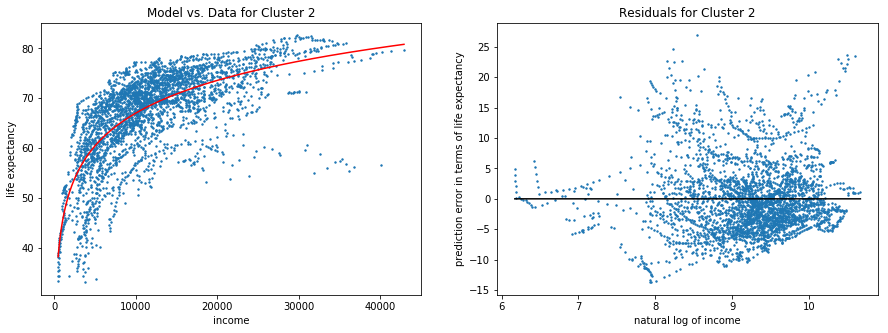

In [51]:
#Create the model and residual plots for cluster 2
c2_rsquared = log_model_plots(cluster2, "Cluster 2")

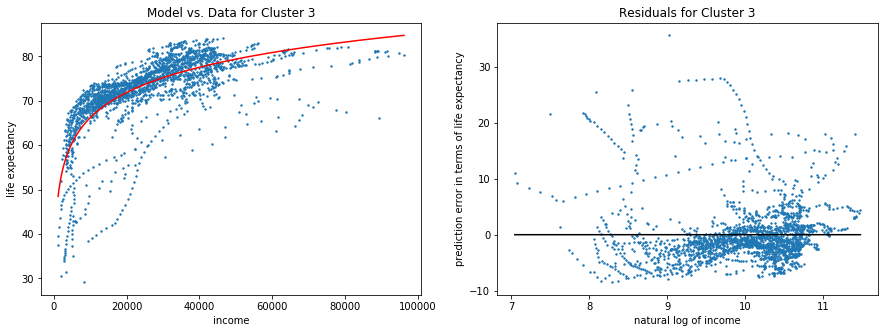

In [52]:
#Create the model and residual plots for cluster 3
c3_rsquared = log_model_plots(cluster3, "Cluster 3")

At a glance, it certainly looks like using KMeans to cluster countries based on income has captured groups in which life expectancy is predicted by income better than it is in the overall population, in groups based on region, or in my top-, bottom-, high-, and low-earning categories.  However, I've made sure to capture rsquared values for each cluster, so let's see how they stack up against each other.

Text(0.5,1,'Mean R-squared by Clustering Method')

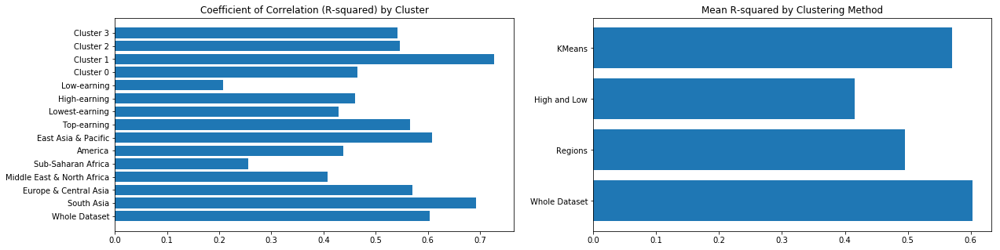

In [53]:
#construct a list of cluster names:
cluster_names = ["Whole Dataset"] + regions + ["Top-earning", "Lowest-earning", "High-earning", "Low-earning", 
                                                 "Cluster 0", "Cluster 1", "Cluster 2", "Cluster 3"]

#construct a list of method names
methods = ["Whole Dataset", "Regions", "High and Low", "KMeans"]

#construct a list of rsquared values
rsquared_values = [overall_log_model_rsquared] + region_rsquared_list + [inc_top_rsquared, inc_bot_rsquared, inc_high_rsquared,
                                                                        inc_low_rsquared, c0_rsquared, c1_rsquared, c2_rsquared,
                                                                        c3_rsquared]
#contruct a list of mean rsquared values by method
method_means = [overall_log_model_rsquared, np.mean(region_rsquared_list), 
                np.mean([inc_top_rsquared, inc_bot_rsquared, inc_high_rsquared, inc_low_rsquared]),
                np.mean([c0_rsquared, c1_rsquared, c2_rsquared, c3_rsquared])]

#plot the clusters and methods with their rsquared values and means
plt.figure(figsize=(20, 5))
plt.subplot(1,2,1)
plt.barh(cluster_names, rsquared_values)
plt.title("Coefficient of Correlation (R-squared) by Cluster")
plt.subplot(1,2,2)
plt.barh(methods, method_means)
plt.title("Mean R-squared by Clustering Method")

## Discussion

My initial research questions were:

1.) What is the relationship between income and life expectancy,

2.) Is this relationship different for very wealthy countries than it is for very poor ones, and

3.) Does the relationship between income and life expectancy vary significantly when we look at clusters of countries picked out by the KMeans method?

Though the original gapminder dataset had data about population as well as data stretching back to the year 1800, population data was not critical to my research questions, and much of the income data in the first hundred years was absent or suspect.  I decided to focus on the period of time after the Second World War, as this is a time during which A.) I had good income data and B.) medical science and economics both changed much more rapidly than they had previously.  To facilitate this focus, I dropped the income data as well as any data prior to 1945.  In addition, I dropped the data for 14 further countries entirely, because they did not have any meaningful income data during this period at all.

Next, I looked at some general descriptions of this trimmed-down data.  Most importantly, I constructed a year-by-year plot showing every tenth percentile from the income data in order to look at how the distribution of incomes changed over time, and I did the same for life expectancy.  This initial visualization suggested a negative answer to my first research question: though both income and life expectancy generally rose, the distribution for life expectancy stayed pretty close, while the income percentiles diverged dramatically over time.  This suggests that wealth inequality has grown much faster than inequality in health outcomes, as captured by life expectancy.  

What I wanted to see, however, was whether we might be able to find specific categories of countries where this general rule didn't hold: categories where life expectancy was more closely tied to income.  To accomplish this, I picked four methods for generating categories, or clusters, of countries:

1.) Using the regions captured in the data itself,
2.) Picking the top-earning and bottom-earning countries out of each region,
3.) Picking high-earning and low-earning countries out of the entire dataset, and
4.) Using K-means to generate clusters.

I ended up with six clusters based on regions, two clusters each from the top/bottom and high/low methods, four clusters from the K-means method.  I then used linear regression to evaluate how closely life expectancy is tied to income inside each cluster.  However, given the distribution of incomes, it was necessary to transform my income data logarithmically, so my linear models actually show the linear relationship between the natural logs of the income values in each category and the life expectancy values in that same category.  Here is what I found.

For the data in general, a post-transformation linear model is a pretty good fit, visually, for the data.  However, it does not have a terrible impressive correlation coefficient (just a hair over 0.6) and we can see that it overestimates life expectancy for very-high-income datapoints.  This is a feature that showed up again and again, across most of the clusters I generated. Indeed, it almost seems as though life expectancy may start to decline after income crosses a certain threshold; perhaps this is due to the increasing availability of unhealthy, luxurious lifestyles.  

The regional clustering method produced acceptable results for some regions (especially South Asia) but significantly poorer results in others (e.g. Sub-Saharan Africa).  On average, the regional clustering method actually significantly underperformed the whole-dataset model.  

The high/low and top/bottom clustering methods produced the worst results overall.  The relationship between income and life expectancy did seem to be different between high-income and low-income countries (re: research question 2), but the overall poor quality of these regression models makes it difficult to say how, or whether that result is significant.  It is likely that there are other confounding factors not captured in this data which make it difficult to draw a conclusion, here.

The K-means clustering method produced some clusters which showed very strong relationships between income and life expectancy, but the average performance here still fell below that of the model built on the dataset at large.

## Conclusions

Income and life expectancy certainly are related, but this relationship is weak and may be largely incidental (since both income and life expectancy tend to rise over time across the board).  Income inequality has grown much faster than life-expectancy inequality.  Several clustering methods were tested, but none seemed to reliably pick out categories of countries where life expectancy was more strongly tied to income.  The K-means method did seem to be better at picking out clusters of countries where this relationship was strong, but not by much.  It seems as though such categories might exist, but (if they do) more data will be required to identify them and figure out what is going on.  

